<a id=1></a>
## Load the data and preprocess it

In [1]:
import pandas as pd

In [2]:
df_hittegolf = pd.read_csv('../analysis/data/nos_hittegolf.csv')
df_hittegolf.drop('Unnamed: 0', axis=1, inplace=True)
df_hittegolf.dropna(subset=['text'] ,inplace=True)
df_hittegolf.dropna(subset=['image_urls'] ,inplace=True)
df_hittegolf.reset_index(drop=True, inplace=True)
print(df_hittegolf.shape)
df_hittegolf.head()

(1173, 8)


,title,url,date,tag,collections,text,subheadings,image_urls
0,Zuid-Franse druiven groeien door klimaatverand...,https://nos.nl/artikel/2481980-zuid-franse-dru...,2023-07-08,NaN,['Economie'],Tegen de heuvels rond Maastricht werden vijfti...,['Einde aan uienteelt'],[{'image_url': 'https://cdn.nos.nl/image/2023/...
1,"Steeds meer mensen een airco, maar experts zie...",https://nos.nl/artikel/2481925-steeds-meer-men...,2023-07-07,NaN,['Binnenland'],Op hete dagen zijn mobiele airco's in winkels ...,NaN,[{'image_url': 'https://cdn.nos.nl/image/2023/...
2,Hofplein in Rotterdam op de schop: minder auto...,https://nos.nl/artikel/2479795-hofplein-in-rot...,2023-06-21,NaN,"['In samenwerking met', 'Rijnmond', 'Regionaal...",Het Hofplein in het centrum van Rotterdam gaat...,['Kosten hoger dan verwacht'],[{'image_url': 'https://cdn.nos.nl/image/2023/...
3,'Klimaatverandering kan desastreuze gezondheid...,https://nos.nl/artikel/2477696-klimaatverander...,2023-06-04,Klimaat,"['Collectie', 'Klimaat', 'Binnenland', 'Buiten...",Dat klimaatverandering kan leiden tot bijvoorb...,"['Directe en indirecte gevolgen', ""'Toch wel e...",[{'image_url': 'https://cdn.nos.nl/image/2023/...
4,"Varkens in slachthuizen lijden onnodig, NVWA g...",https://nos.nl/nieuwsuur/artikel/2471637-varke...,2023-04-16,NaN,"['Nieuwsuur', 'Binnenland']",Vanaf volgend jaar gaat de overheid optreden t...,"['Vechten', 'Hittestress']",[{'image_url': 'https://cdn.nos.nl/image/2023/...


In [3]:
df_hittegolf.loc[0, 'image_urls']

"[{'image_url': 'https://cdn.nos.nl/image/2023/07/08/985272/1024x576a.jpg', 'caption': 'Viognier druif in Maastricht'}, {'image_url': 'https://cdn.nos.nl/image/2023/07/08/985274/1024x576a.jpg', 'caption': 'Wijngaard Apostelhoeve Maastricht'}]"

In [4]:
import ast

def extract_first_image(image_urls):
    if image_urls is None:
        return None, None
    else:
        parsed_images = ast.literal_eval(image_urls)
        image = parsed_images[0]
        image_url = image['image_url']
        caption = image['caption']
        return image_url, caption

df_hittegolf['image_url'], df_hittegolf['caption'] = zip(*df_hittegolf['image_urls'].map(extract_first_image))
print(df_hittegolf.shape)
df_hittegolf.head()

(1173, 10)


,title,url,date,tag,collections,text,subheadings,image_urls,image_url,caption
0,Zuid-Franse druiven groeien door klimaatverand...,https://nos.nl/artikel/2481980-zuid-franse-dru...,2023-07-08,NaN,['Economie'],Tegen de heuvels rond Maastricht werden vijfti...,['Einde aan uienteelt'],[{'image_url': 'https://cdn.nos.nl/image/2023/...,https://cdn.nos.nl/image/2023/07/08/985272/102...,Viognier druif in Maastricht
1,"Steeds meer mensen een airco, maar experts zie...",https://nos.nl/artikel/2481925-steeds-meer-men...,2023-07-07,NaN,['Binnenland'],Op hete dagen zijn mobiele airco's in winkels ...,NaN,[{'image_url': 'https://cdn.nos.nl/image/2023/...,https://cdn.nos.nl/image/2023/07/07/985126/102...,None
2,Hofplein in Rotterdam op de schop: minder auto...,https://nos.nl/artikel/2479795-hofplein-in-rot...,2023-06-21,NaN,"['In samenwerking met', 'Rijnmond', 'Regionaal...",Het Hofplein in het centrum van Rotterdam gaat...,['Kosten hoger dan verwacht'],[{'image_url': 'https://cdn.nos.nl/image/2023/...,https://cdn.nos.nl/image/2023/06/21/980329/102...,Een impressie van het nieuwe Hofplein in Rotte...
3,'Klimaatverandering kan desastreuze gezondheid...,https://nos.nl/artikel/2477696-klimaatverander...,2023-06-04,Klimaat,"['Collectie', 'Klimaat', 'Binnenland', 'Buiten...",Dat klimaatverandering kan leiden tot bijvoorb...,"['Directe en indirecte gevolgen', ""'Toch wel e...",[{'image_url': 'https://cdn.nos.nl/image/2023/...,https://cdn.nos.nl/image/2023/06/04/975519/102...,Een dokter onderzoekt een ondervoede baby in J...
4,"Varkens in slachthuizen lijden onnodig, NVWA g...",https://nos.nl/nieuwsuur/artikel/2471637-varke...,2023-04-16,NaN,"['Nieuwsuur', 'Binnenland']",Vanaf volgend jaar gaat de overheid optreden t...,"['Vechten', 'Hittestress']",[{'image_url': 'https://cdn.nos.nl/image/2023/...,https://cdn.nos.nl/image/2023/04/16/961199/102...,None


In [5]:
df_hittegolf['image_text'] = df_hittegolf['title'] +  '. ' + df_hittegolf.fillna('')['caption']
df_hittegolf.loc[0, 'image_text']

'Zuid-Franse druiven groeien door klimaatverandering goed in Maastricht. Viognier druif in Maastricht'

In [6]:
from PIL import Image
import requests
from io import BytesIO

def load_images_from_urls(image_urls):
    images = []
    for url in image_urls:
        response = requests.get(url)
        if response.status_code == 200:
            img = Image.open(BytesIO(response.content))
            images.append(img)
        else:
            print(f"Failed to load image from URL: {url}")
    return images

images = df_hittegolf['image_url'].tolist()
loaded_images = load_images_from_urls(images)
print(f"Downloaded {len(loaded_images)} images")

Downloaded 1173 images


<a id=2></a>
## Run multimodal BERTopic with images + title and caption

In [7]:
from bertopic import BERTopic
from bertopic.representation import VisualRepresentation
from bertopic.backend import MultiModalBackend

docs = df_hittegolf['image_text'].tolist()

# Additional ways of representing a topic
visual_model = VisualRepresentation()

# Make sure to add the `visual_model` to a dictionary
representation_model = {
   "Visual_Aspect":  visual_model,
}
topic_model = BERTopic(representation_model=representation_model, verbose=True)
topics, probs = topic_model.fit_transform(docs, images=loaded_images)

/Users/tom/opt/anaconda3/envs/BERTopic/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Batches: 100%|██████████| 37/37 [00:09<00:00,  3.89it/s]
2023-12-06 13:22:19,314 - BERTopic - Transformed documents to Embeddings
2023-12-06 13:22:25,024 - BERTopic - Reduced dimensionality
2023-12-06 13:22:25,060 - BERTopic - Clustered reduced embeddings
100%|██████████| 16/16 [00:00<00:00, 21.43it/s]


In [9]:
#topic_model.save('../analysis/topic_models/multimodal')

In [22]:
# load model
topic_model = BERTopic.load("../analysis/topic_models/multimodal")

<a id=3></a>
## Visualise image clusters

In [26]:
import base64
from io import BytesIO
from IPython.display import HTML

def image_base64(im):
    if isinstance(im, str):
        im = get_thumbnail(im)
    with BytesIO() as buffer:
        im.save(buffer, 'jpeg')
        return base64.b64encode(buffer.getvalue()).decode()


def image_formatter(im):
    return f'<img src="data:image/jpeg;base64,{image_base64(im)}">'

# Extract dataframe
df = topic_model.get_topic_info()
df.drop(columns=['Count', 'Representative_Docs', 'Topic', 'Name'], inplace=True)

# Visualize the images
HTML(df.to_html(formatters={'Visual_Aspect': image_formatter}, escape=False))

In [83]:
topic_model.visualize_hierarchy()

<a id=4></a>
## Visualise images from the most representative docs of each topic

In [ ]:
# load text model
#text_model = BERTopic.load('../analysis/topic_models/topic_model_hittegolf')

In [17]:
from bertopic import BERTopic

In [18]:
import pickle

# load the dataframe with the documents and their topics
with open('../analysis/topic_models/nos_hittegolf.pkl', 'rb') as file:
    df_text = pickle.load(file)

# extract the first image url from the image_urls column
def extract_first_image_url(image_urls):
    if image_urls is None or not isinstance(image_urls, str):
        return None  # or return a default URL or handle differently based on your use case
    try:
        parsed_images = ast.literal_eval(image_urls)
        if isinstance(parsed_images, list) and len(parsed_images) > 0:
            image = parsed_images[0]
            if isinstance(image, dict) and 'image_url' in image:
                return image['image_url']
    except (ValueError, SyntaxError, TypeError, KeyError):
        pass
    return None

df_text['image_url'] = df_text['image_urls'].map(extract_first_image_url)

In [19]:
# for each relevant topic, get the 6 most representative images

topic_images = []
for topic in df_text['topic'].unique():
    df_topic = df_text[df_text['topic'] == topic]
    df_topic= df_topic.dropna(subset=['image_url'])
    df_topic = df_topic.sort_values(by='topic_prob', ascending=False).head(6)
    topic_images.append(df_topic)

# combine the dataframes
df_topic_images = pd.concat(topic_images)

# load images
images = df_topic_images['image_url'].tolist()
loaded_images = load_images_from_urls(images)
print(f"Downloaded {len(loaded_images)} images")

# create a dataframe with the images
df_topic_images['image'] = loaded_images

# group the images by topic
topic_groups = df_topic_images.groupby('topic')['image'].apply(list)

Downloaded 138 images


In [20]:
# get topic names and their words
text_model = BERTopic.load('../analysis/topic_models/topic_model_hittegolf')
freq = text_model.get_topic_info()
freq = freq.iloc[1:].reset_index(drop=True)

# add topic names to topic groups
topic_groups = topic_groups.iloc[1:].reset_index()

topic_groups['Name'] = topic_groups['topic'].map(freq['CustomName'])
topic_groups['Representation'] = topic_groups['topic'].map(freq['Representation'])

# change order of columns
topic_groups = topic_groups[['topic', 'Name', 'Representation', 'image']]
topic_groups.head()

,topic,Name,Representation,image
0,0,Weather & Temperature,"[graden, bilt, dagen, 25 graden, 30 graden, 25...",[<PIL.JpegImagePlugin.JpegImageFile image mode...
1,1,Wildfires,"[branden, vuur, bosbranden, brand, geëvacueerd...",[<PIL.JpegImagePlugin.JpegImageFile image mode...
2,2,Sports & Athletes,"[wk, voetbal, wedstrijd, spelen, ajax, club, t...",[<PIL.JpegImagePlugin.JpegImageFile image mode...
3,3,Electricity,"[gas, energie, waterstof, biomassa, aardgas, d...",[<PIL.JpegImagePlugin.JpegImageFile image mode...
4,4,Climate change,"[ijs, opwarming, aarde, klimaatverandering, oc...",[<PIL.JpegImagePlugin.JpegImageFile image mode...


Topic,Name,Representation,Images
0,Weather & Temperature,"['graden', 'bilt', 'dagen', '25 graden', '30 graden', '25', '30', 'hittegolf', 'temperatuur', 'weerman']",
1,Wildfires,"['branden', 'vuur', 'bosbranden', 'brand', 'geëvacueerd', 'gebied', 'brandweerlieden', 'hectare', 'vlammen', 'verwoest']",
2,Sports & Athletes,"['wk', 'voetbal', 'wedstrijd', 'spelen', 'ajax', 'club', 'trainer', 'spelers', 'marathon', 'race']",
3,Electricity,"['gas', 'energie', 'waterstof', 'biomassa', 'aardgas', 'duurzame', 'co2', 'warmtenet', 'bedrijven', 'elektriciteit']",
4,Climate change,"['ijs', 'opwarming', 'aarde', 'klimaatverandering', 'oceaan', 'zee ijs', 'zee', 'antarctica', 'wetenschappers', 'noordpool']",
5,NOS morning report,"['gemist', 'fijne', 'vandaag', 'kun vandaag', 'overzicht', 'president', 'binnenlandbuitenland', 'werkzaamheden', 'spoor', 'verwachten']",
6,Water & Droughts,"['droogte', 'water', 'waterschappen', 'waterschap', 'rijkswaterstaat', 'rijn', 'brug', 'bruggen', 'vitens', 'boeren']",
7,Ecological Impact,"['muggen', 'vliet', 'blauwalg', 'hooikoorts', 'overlast', 'bloei', 'bijen', 'tijgermug', 'klachten', 'eitjes']",
8,Events,"['vierdaagse', 'deelnemers', 'organisatie', 'bezoekers', 'wandelaars', 'lopers', 'route', 'uur', 'waterpunten', 'kilometer']",
9,Animal Welfare,"['dieren', 'varkens', 'nvwa', 'boa', 'hittestress', 'wakker dier', 'ventilatie', 'regels', 'dier', 'wakker']",

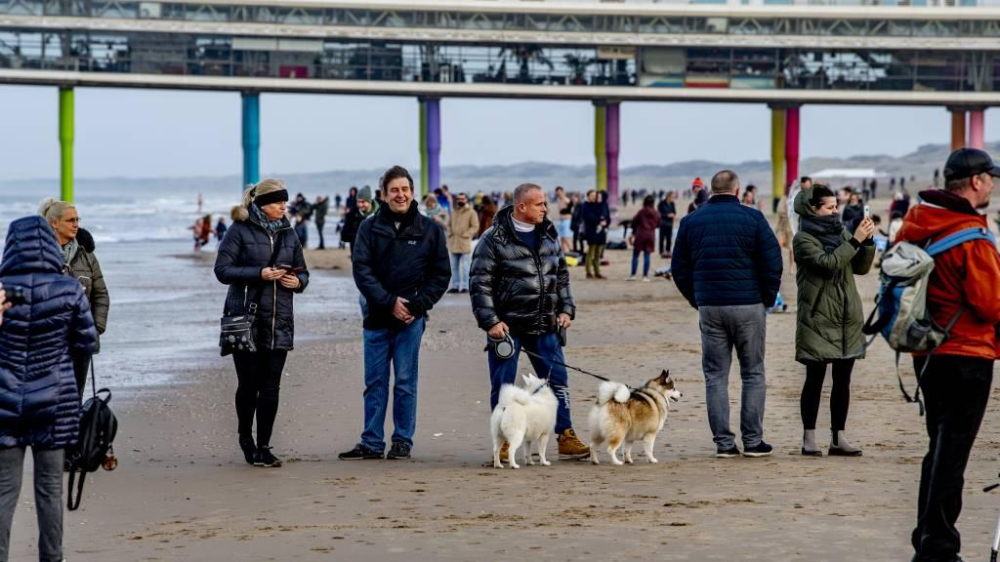
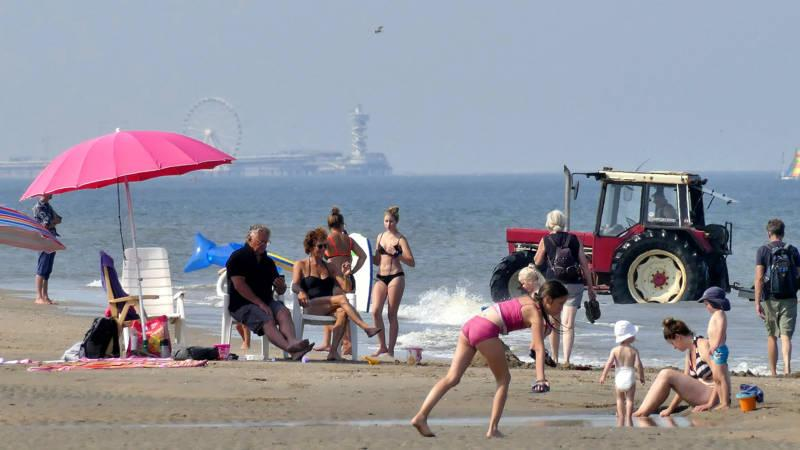
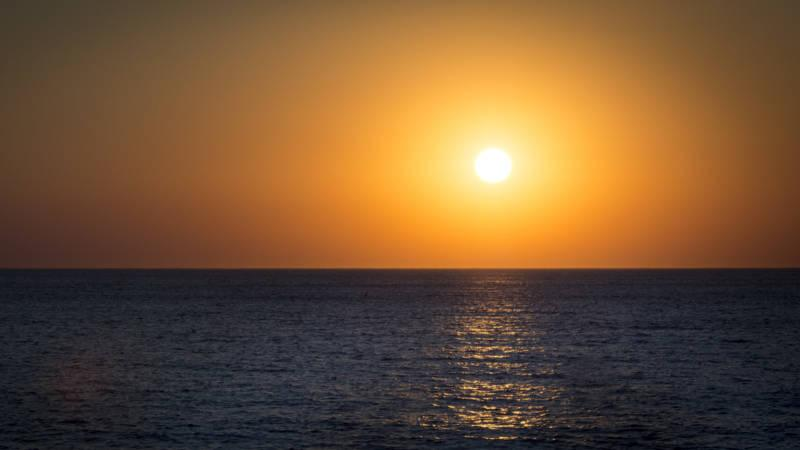
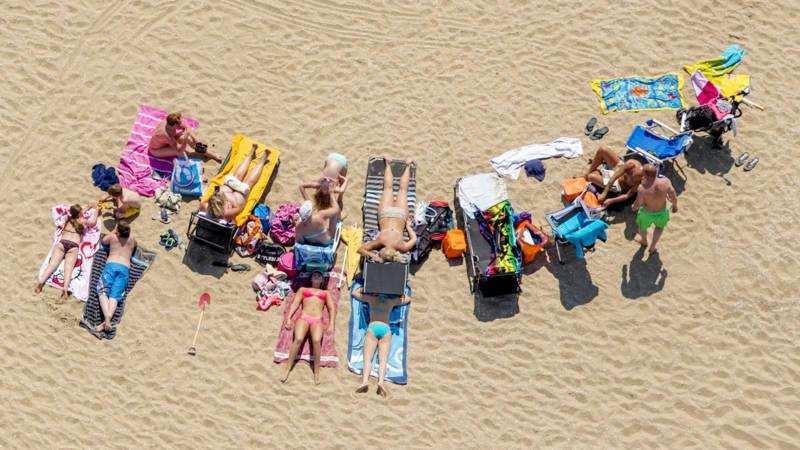
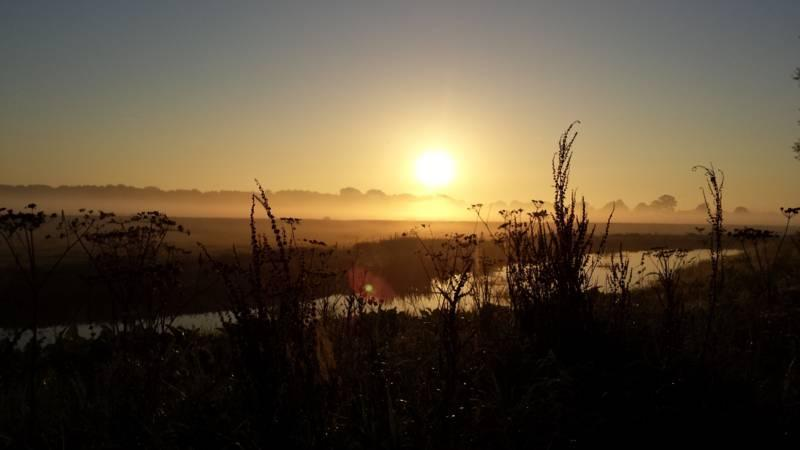
...
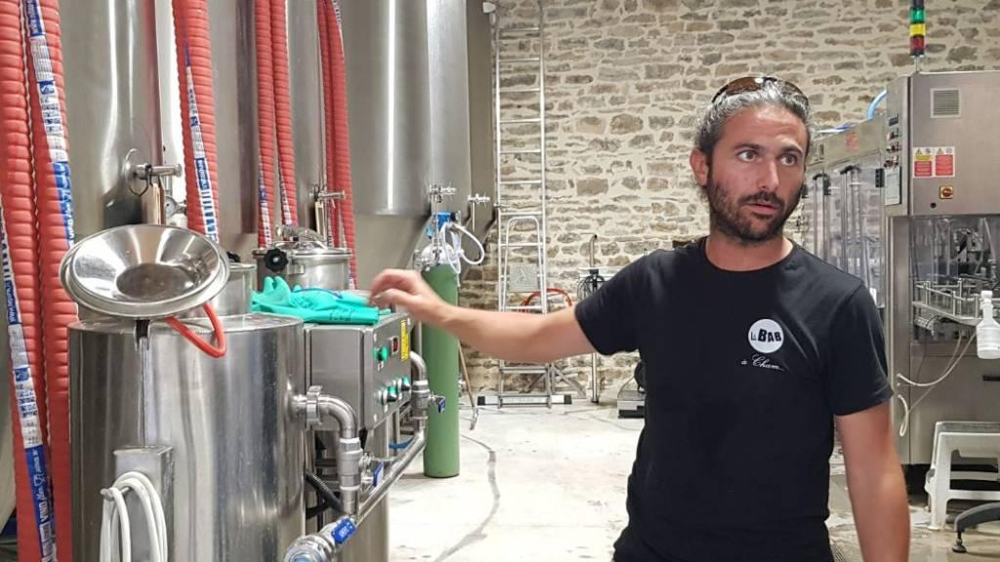
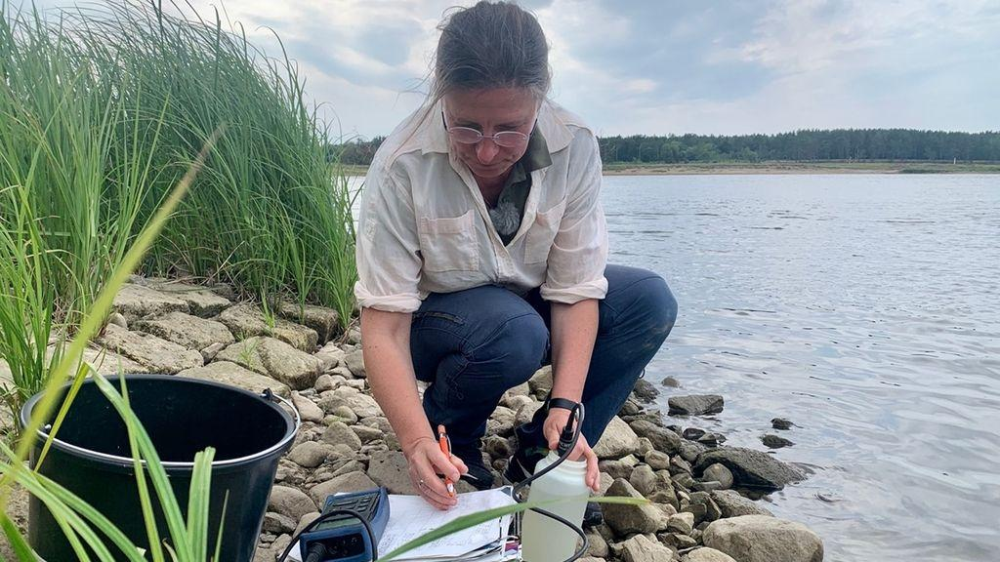
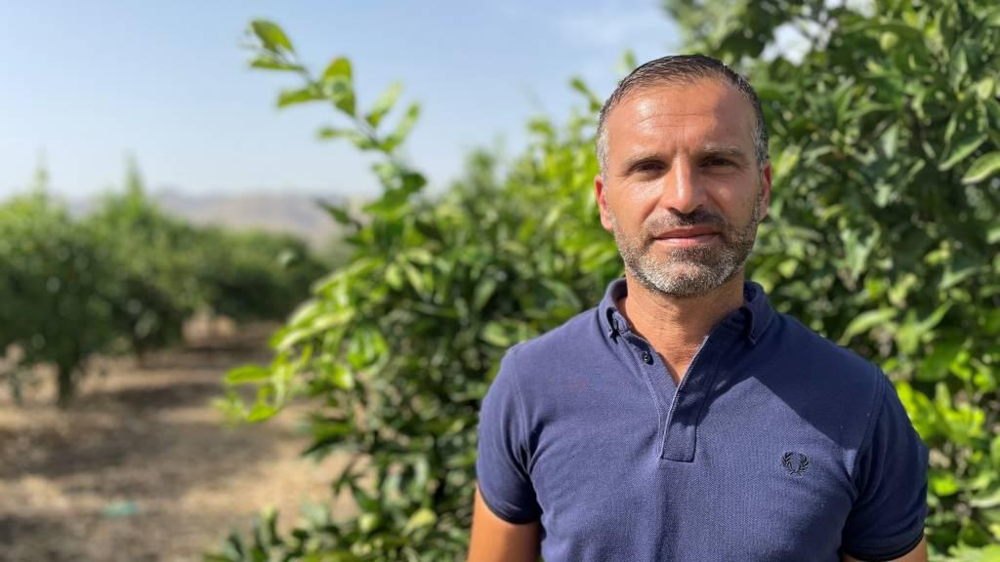
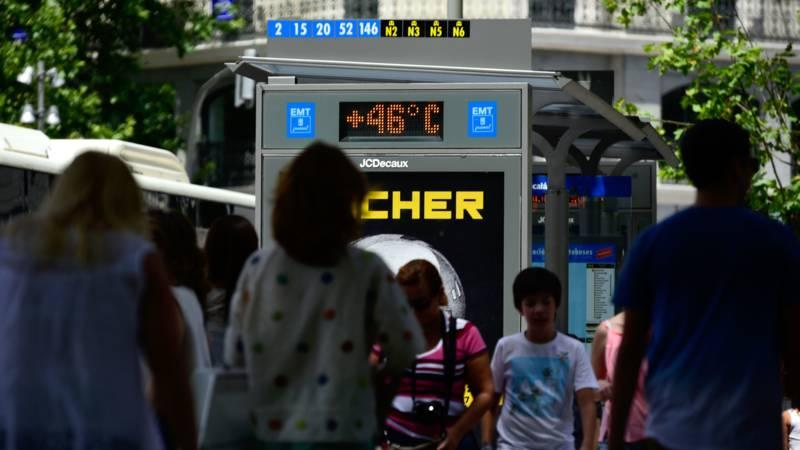
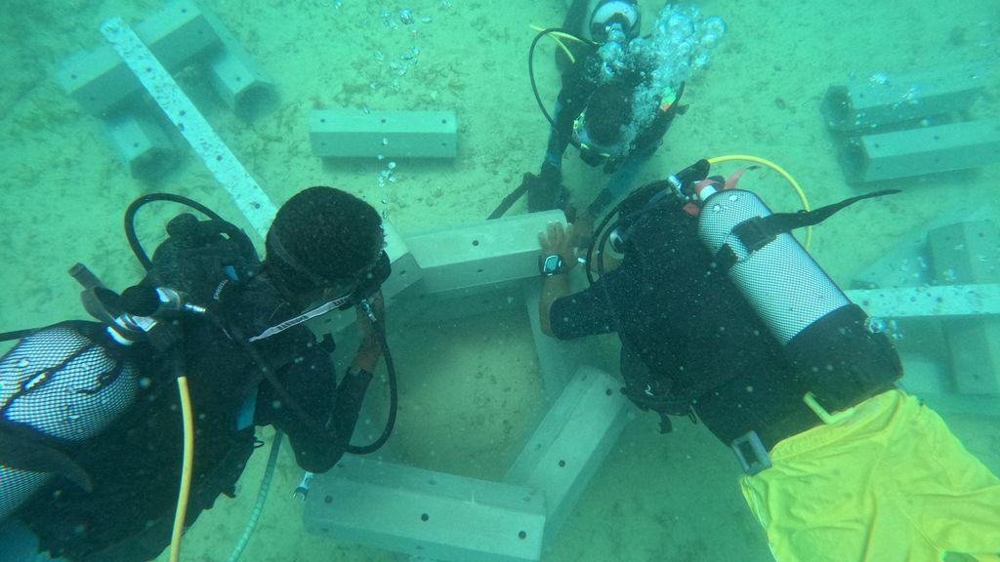

In [29]:
from IPython.display import HTML
import io

# Assuming 'topic_groups' DataFrame contains columns ['topic', 'Name', 'Representation', 'image']

# Function to convert image to base64
def image_base64(im):
    buffered = io.BytesIO()
    im = im.convert("RGB")  # Convert RGBA to RGB
    im.save(buffered, format="JPEG")
    return base64.b64encode(buffered.getvalue()).decode()

def images_formatter(images):
    images_html = ''.join([
        f'<img style="max-width: 200px; max-height: 200px; margin: 5px;" src="data:image/jpeg;base64,{image_base64(im)}">'
        for im in images
    ])
    return f'<div style="display: flex; flex-wrap: wrap;">{images_html}</div>'

html_content = '<table border="1"><tr><th>Topic</th><th>Name</th><th>Representation</th><th>Images</th></tr>'
for index, row in topic_groups.iterrows():
    topic = row['topic']
    name = row['Name']
    representation = row['Representation']
    images = row['image']
    
    images_html = images_formatter(images)
    
    html_content += f'<tr><td>{topic}</td><td>{name}</td><td>{representation}</td><td>{images_html}</td></tr>'
html_content += '</table>'

# save the html
with open('../analysis/topic_models/multimodal.html', 'w') as file:
    file.write(html_content)

HTML(html_content)

<a id=5></a>
## Experiment with all images

In [28]:
import ast

# iterate through the dataframe and convert image_urls to a list of dictionaries
images_per_article = []
for index, row in df_hittegolf.iterrows():
    parsed_images = ast.literal_eval(row['image_urls'])
    for image in parsed_images:
        first_image = False
        if image == parsed_images[0]:
            first_image = True
        images_per_article.append({'url': row['url'], 
                                   'title': row['title'],
                                   'image_url': image['image_url'], 
                                   'caption': image['caption'],
                                   'first_image': first_image, 
                                   'tag': row['tag'], 
                                   'date': row['date'], 
                                   'text': row['text'], 
                                   'collections': row['collections'], 
                                   'subheadings': row['subheadings']})

df_images = pd.DataFrame(images_per_article)
print(df_images.shape)
df_images.head()

(2531, 10)


,url,title,image_url,caption,first_image,tag,date,text,collections,subheadings
0,https://nos.nl/artikel/2481980-zuid-franse-dru...,Zuid-Franse druiven groeien door klimaatverand...,https://cdn.nos.nl/image/2023/07/08/985272/102...,Viognier druif in Maastricht,True,NaN,2023-07-08,Tegen de heuvels rond Maastricht werden vijfti...,['Economie'],['Einde aan uienteelt']
1,https://nos.nl/artikel/2481980-zuid-franse-dru...,Zuid-Franse druiven groeien door klimaatverand...,https://cdn.nos.nl/image/2023/07/08/985274/102...,Wijngaard Apostelhoeve Maastricht,False,NaN,2023-07-08,Tegen de heuvels rond Maastricht werden vijfti...,['Economie'],['Einde aan uienteelt']
2,https://nos.nl/artikel/2481925-steeds-meer-men...,"Steeds meer mensen een airco, maar experts zie...",https://cdn.nos.nl/image/2023/07/07/985126/102...,None,True,NaN,2023-07-07,Op hete dagen zijn mobiele airco's in winkels ...,['Binnenland'],NaN
3,https://nos.nl/artikel/2481925-steeds-meer-men...,"Steeds meer mensen een airco, maar experts zie...",https://cdn.nos.nl/image/2023/07/07/985127/102...,None,False,NaN,2023-07-07,Op hete dagen zijn mobiele airco's in winkels ...,['Binnenland'],NaN
4,https://nos.nl/artikel/2479795-hofplein-in-rot...,Hofplein in Rotterdam op de schop: minder auto...,https://cdn.nos.nl/image/2023/06/21/980329/102...,Een impressie van het nieuwe Hofplein in Rotte...,True,NaN,2023-06-21,Het Hofplein in het centrum van Rotterdam gaat...,"['In samenwerking met', 'Rijnmond', 'Regionaal...",['Kosten hoger dan verwacht']


In [29]:
df_images = df_images.dropna(subset=['caption'])
df_images.reset_index(drop=True, inplace=True)
print(df_images.shape) 

(1895, 10)


In [30]:
from PIL import Image
import requests
from io import BytesIO

def load_images_from_urls(image_urls):
    images = []
    for url in image_urls:
        response = requests.get(url)
        if response.status_code == 200:
            img = Image.open(BytesIO(response.content))
            images.append(img)
        else:
            print(f"Failed to load image from URL: {url}")
    return images

images = df_images['image_url'].tolist()
loaded_images = load_images_from_urls(images)

In [31]:
len(loaded_images)

1895

In [32]:
all_docs = df_images['caption'].tolist()

# Additional ways of representing a topic
visual_model = VisualRepresentation()

# Make sure to add the `visual_model` to a dictionary
representation_model = {
   "Visual_Aspect":  visual_model,
}
topic_model_all = BERTopic(representation_model=representation_model, verbose=True)
topics_all, probs_all = topic_model_all.fit_transform(all_docs, images=loaded_images)

Batches: 100%|██████████| 60/60 [00:08<00:00,  7.27it/s]
2023-12-04 15:34:04,019 - BERTopic - Transformed documents to Embeddings
2023-12-04 15:34:11,487 - BERTopic - Reduced dimensionality
2023-12-04 15:34:11,547 - BERTopic - Clustered reduced embeddings
100%|██████████| 37/37 [00:01<00:00, 19.58it/s]


,Representation,Visual_Aspect
0,"[de, in, van, het, op, een, en, met, bij, voor]",
1,"[een, bij, het, in, op, zijn, aan, is, wordt, werk]",
2,"[water, waterstand, een, lage, bij, in, uit, wateroverlast, de, het]",
3,"[brand, brandweer, brandweerlieden, bestrijden, brandweerman, californi, uitgebrande, natuurbranden, de, staat]",
4,"[strand, zandvoort, het, drukte, op, scheveningen, strandgangers, badgasten, scheveningse, hoek]",
5,"[nederland, rotterdam, groningen, in, het, zwitserland, weekend, rotterdamse, als, amsterdam]",
6,"[bosbranden, bosbrand, buurt, portugal, brazili, de, californi, janeiro, blanc, canadese]",
7,"[door, de, wordt, droogte, rijkswaterstaat, geld, vanwege, besparen, orkaan, problemen]",
8,"[temperatuur, temperaturen, hoge, graden, gemeten, thermometer, bos, komende, liep, sevilla]",
9,"[van, de, haven, draeck, tzi, lopers, prinses, boord, groene, rode]",

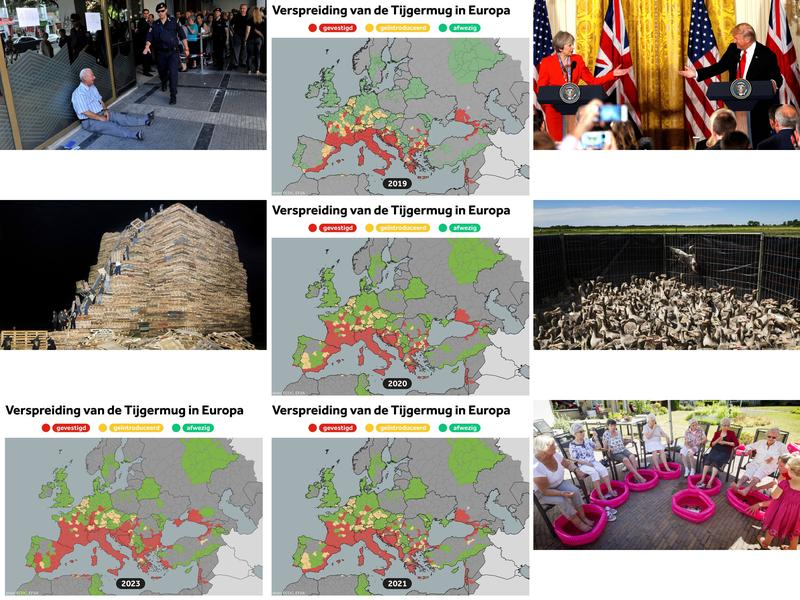
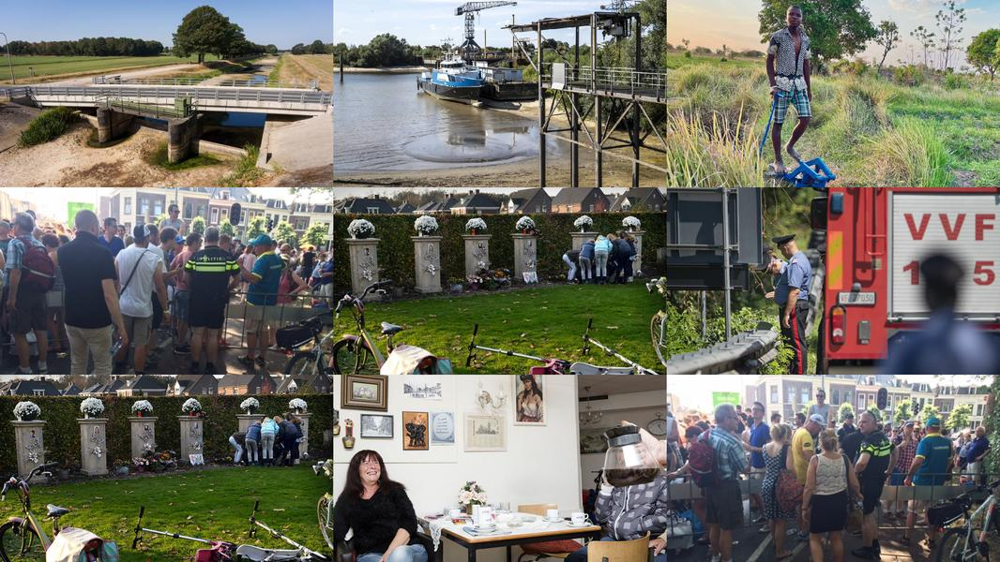
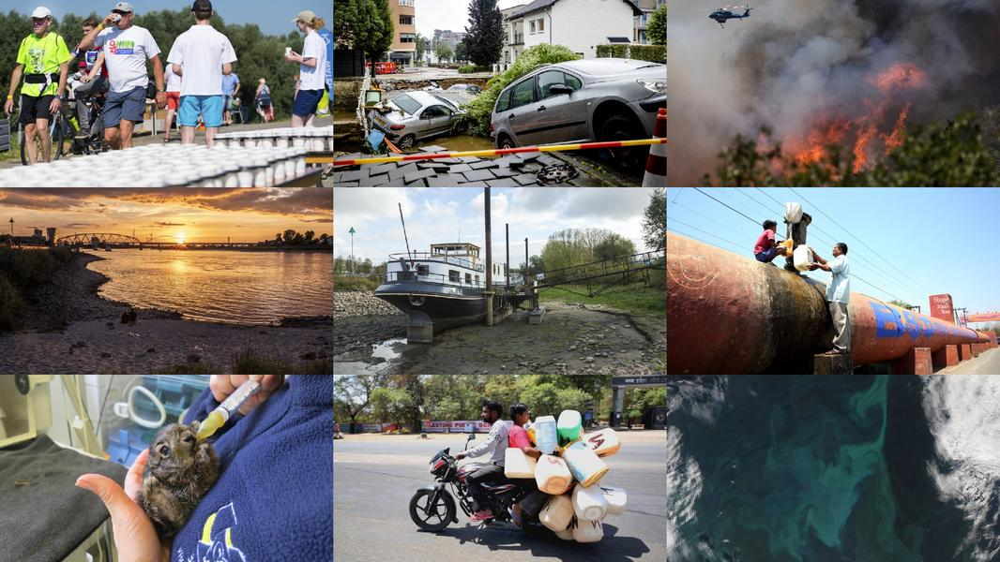
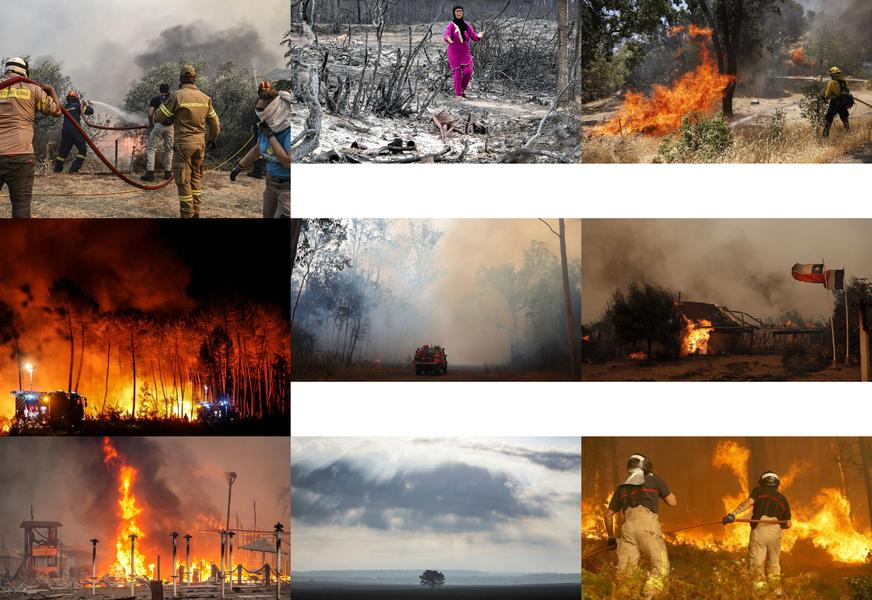
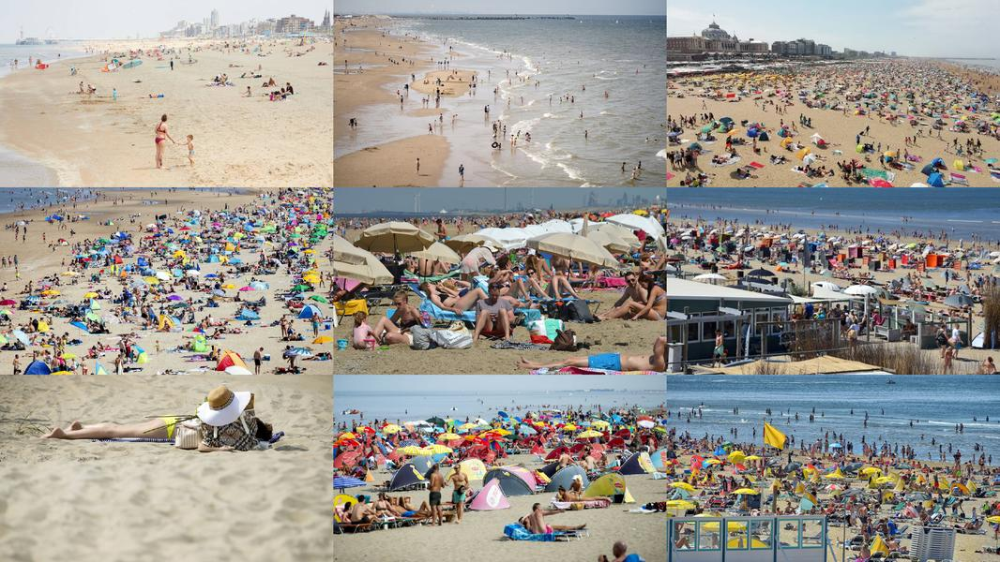
...
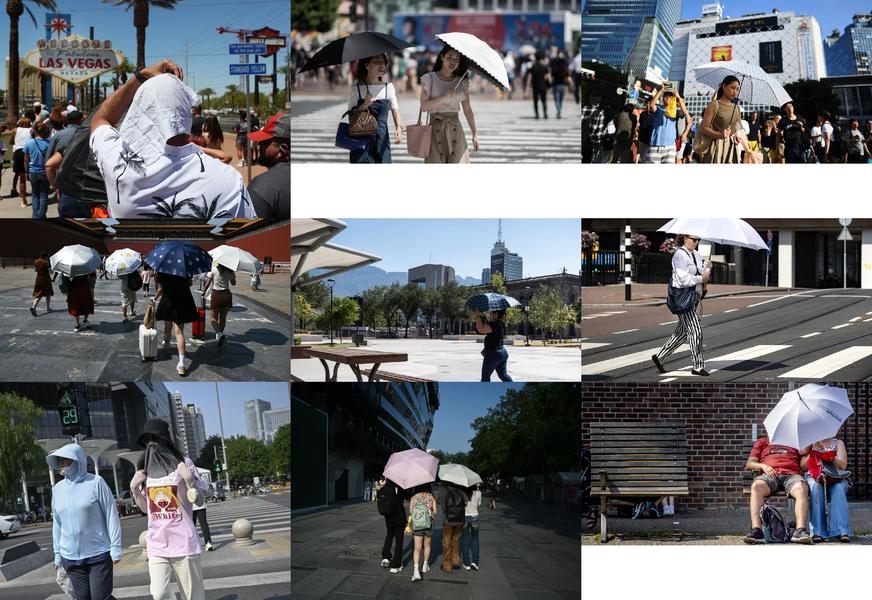
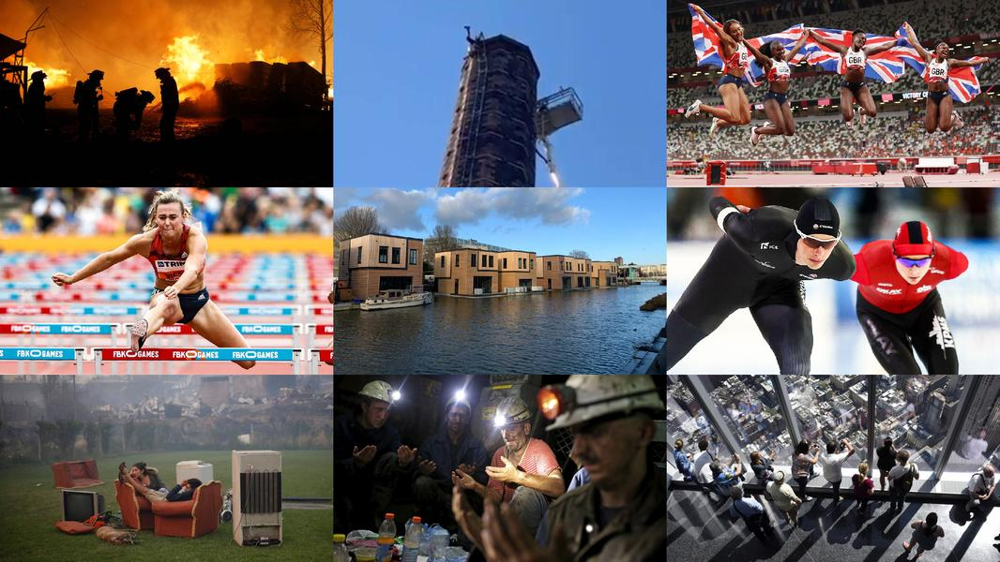
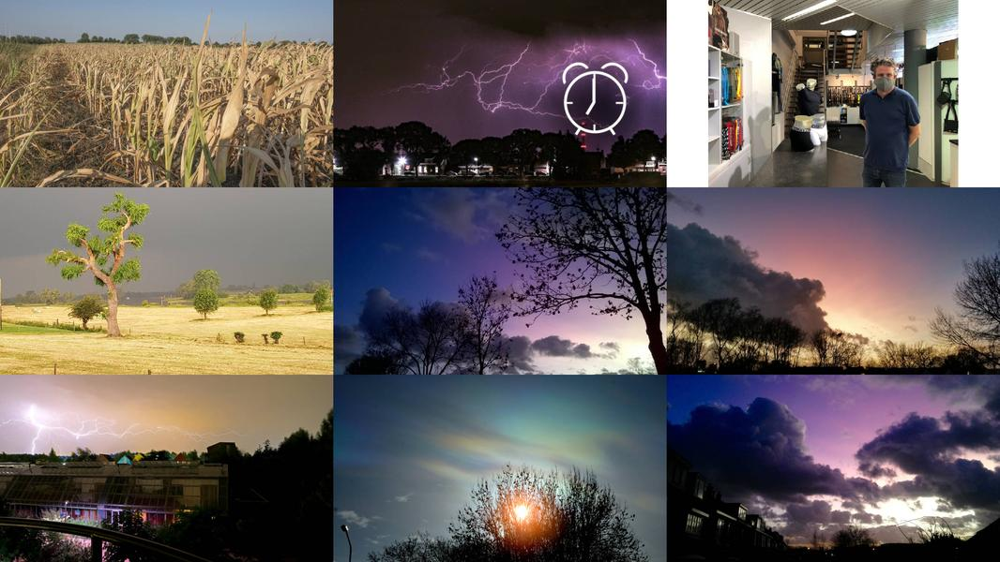
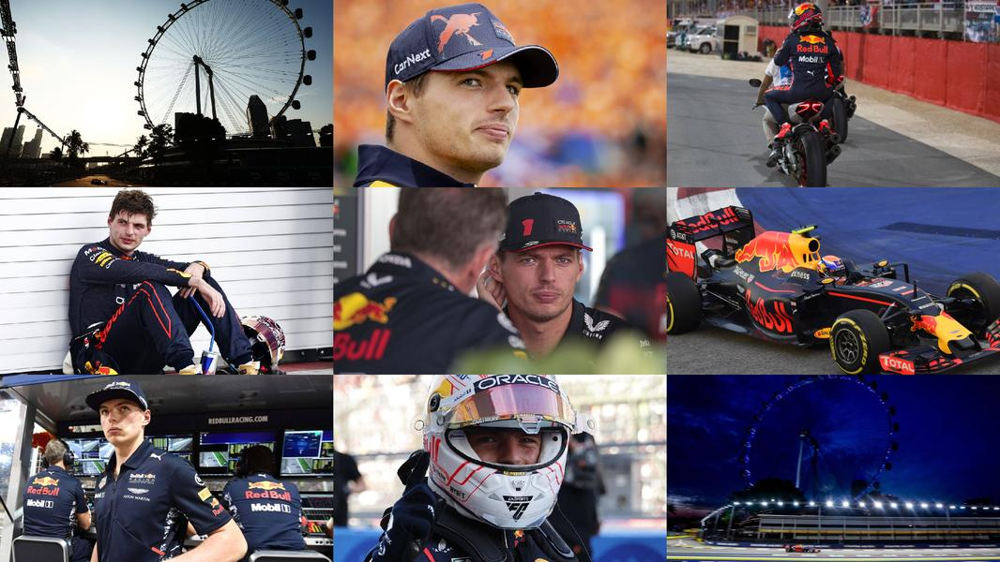
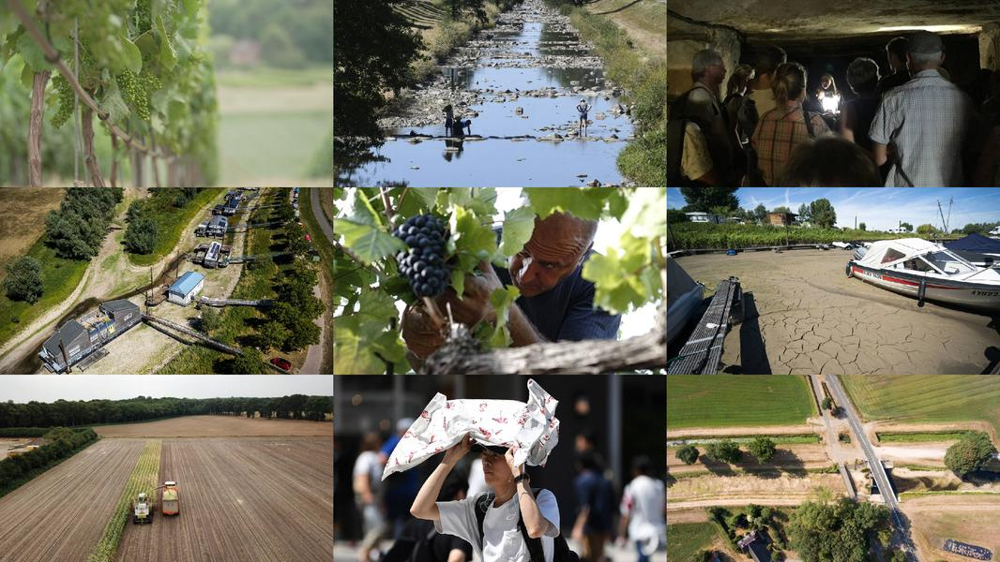

In [34]:
# Extract dataframe
df = topic_model_all.get_topic_info()
df.drop(columns=['Count', 'Representative_Docs', 'Topic', 'Name'], inplace=True)

# Visualize the images
HTML(df.to_html(formatters={'Visual_Aspect': image_formatter}, escape=False))